In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
import numpy as np
import scipy as sc
from scipy import ndimage
from skimage import filters
from matplotlib import pyplot as plt
from PIL import Image

import plotly.express as px

# sns.set(context='poster')
%matplotlib inline

<IPython.core.display.Javascript object>

### Problem 1


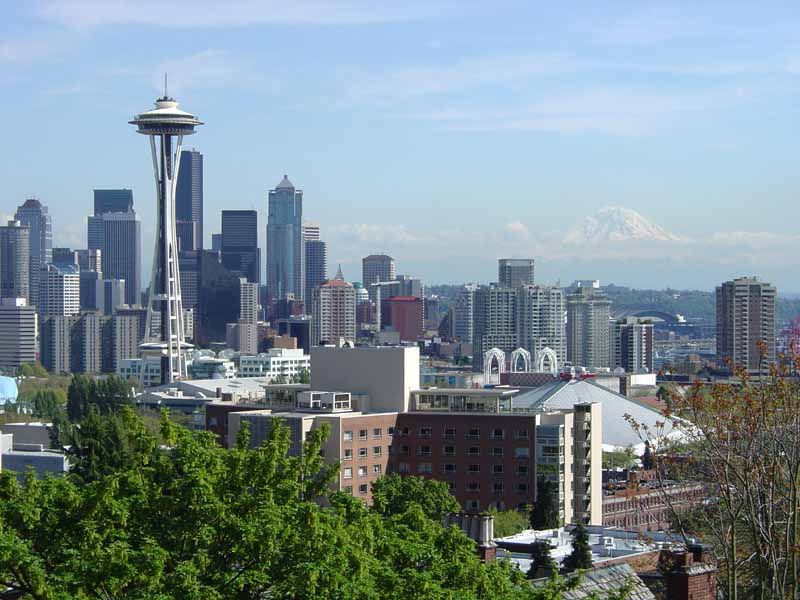

<IPython.core.display.Javascript object>

In [3]:
image = Image.open("hw1_data/Seattle.jpg")
image = np.asarray(image)
px.imshow(image)

Gaussian filter is defined as: $$ G(\mathbf{x}; \sigma^2) = \frac{1}{2 \pi \sigma^2} \exp{-\frac{\mathbf{x}^T \mathbf{x}}{2 \sigma^2}}$$


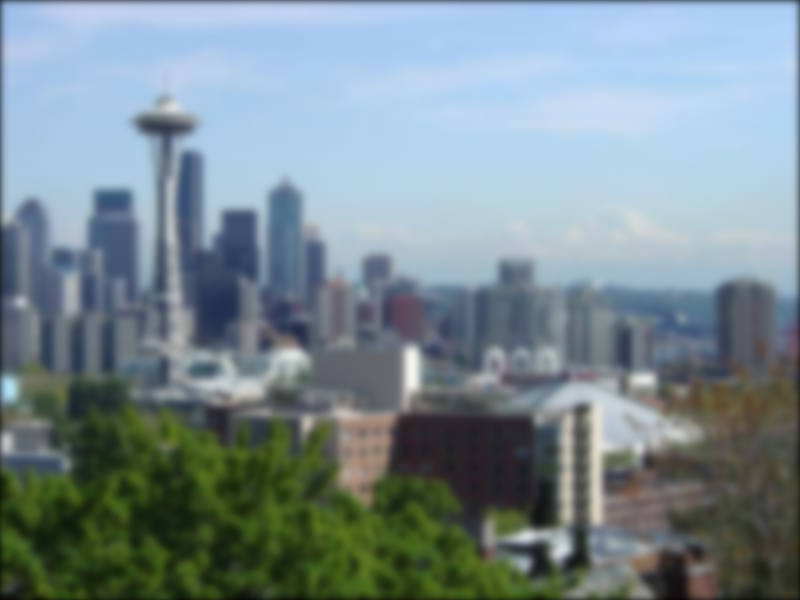

<IPython.core.display.Javascript object>

In [66]:
def GaussianBlurImage(image, sigma):
    filter_size = 2 * int(4 * sigma + 0.5) + 1
    gaussian_filter = np.zeros((filter_size, filter_size), np.float32)
    for i in range(filter_size):
        for j in range(filter_size):
            x = i - filter_size // 2
            y = j - filter_size // 2
            gaussian_filter[i, j] = (
                1
                / (2 * np.pi * sigma ** 2)
                * np.exp(-(x ** 2 + y ** 2) / (2 * sigma ** 2))
            )

    im_filtered = np.zeros_like(image, dtype=np.float32)

    # Filter for each RGB
    for c in range(3):
        im_filtered[:, :, c] = sc.ndimage.convolve(
            image[:, :, c], gaussian_filter, mode="constant", cval=0
        )  # convolve applies zero-padding itself
    fig = px.imshow(np.clip(im_filtered, 0, 255).astype(np.uint8))
    fig.write_image("1.png")
    return fig


GaussianBlurImage(image, 4)


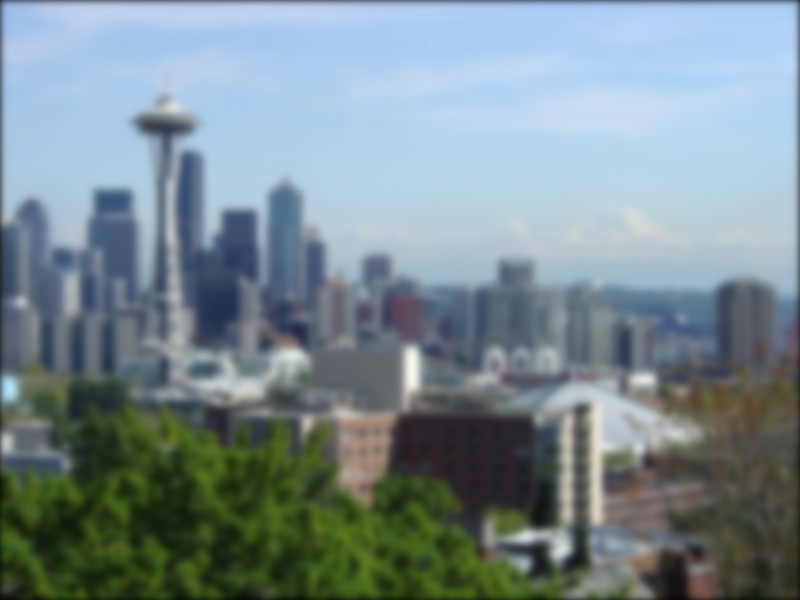

<IPython.core.display.Javascript object>

In [65]:
im_filtered_skimage = filters.gaussian(
    image, sigma=4, mode="constant", cval=0.0, multichannel=True, preserve_range=True
)
px.imshow(im_filtered_skimage)

### Problem 2

Filter size =  33
[3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05
 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05
 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05
 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05
 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05
 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05 3.3457556e-05
 3.3457556e-05 3.3457556e-05 3.3457556e-05]
[8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05
 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05
 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05
 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05
 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05
 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05 8.814892e-05
 8.814892e-05 8.814892e-05 8.814892e-05]
[0.00021817 0.00021817 0.00021817 0.00021817 0.00021817 0.00021817
 0.00021


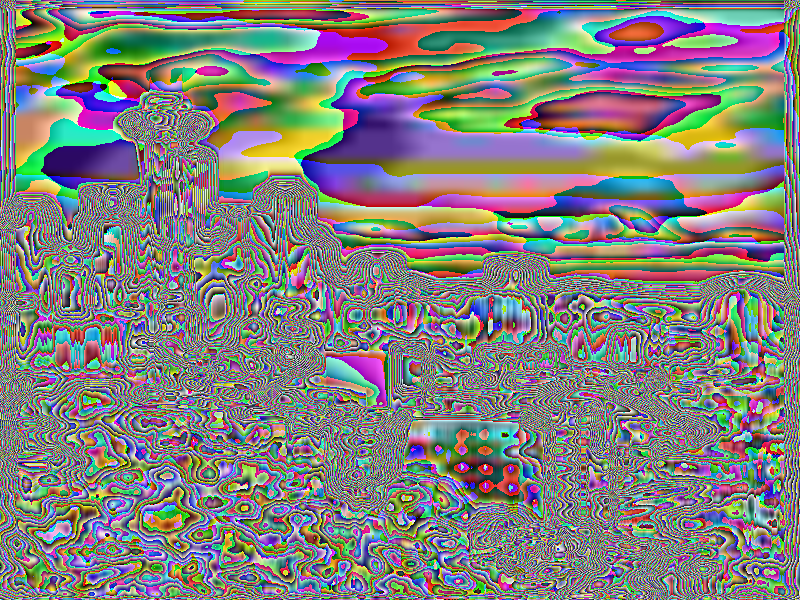

<IPython.core.display.Javascript object>

In [80]:
def SeparableGaussianBlurImage(image, sigma):
    filter_size = 2 * int(4 * sigma + 0.5) + 1
    print("Filter size = ", filter_size)
    gaussian_filter = np.zeros((filter_size, filter_size), np.float32)
    for i in range(filter_size):
        x = i - filter_size // 2
        gaussian_filter[i, :] = (
            1
            / np.sqrt(2 * np.pi * sigma ** 2)
            * np.exp(
                -(x ** 2) / (2 * sigma ** 2)
            )  # need sqrt in denominator of constant
        )
        print(gaussian_filter[i, :])

    #     for j in range(filter_size):
    #         y = j - filter_size // 2
    #         gaussian_filter[:, j] = (
    #             1
    #             / (2 * np.pi * sigma ** 2)
    #             * np.exp(
    #                 -(y ** 2) / (2 * sigma ** 2)
    #             )  # need sqrt in denominator of constant
    #         )

    im_filtered = np.zeros_like(image, dtype=np.float32)

    # Filter for each RGB
    for c in range(3):
        im_filtered[:, :, c] = sc.ndimage.convolve(
            image[:, :, c], gaussian_filter, mode="constant", cval=0
        )  # convolve applies zero-padding itself

    fig = px.imshow(np.clip(im_filtered, 0, 255).astype(np.uint8))
    fig.write_image("2.png")
    return fig


SeparableGaussianBlurImage(image, 4.0)

### Problem 3


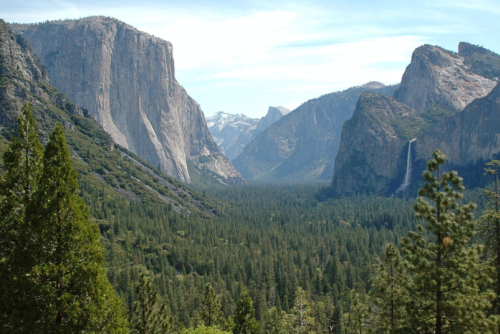

<IPython.core.display.Javascript object>

In [83]:
yosemite = Image.open("hw1_data/Yosemite.png")
yosemite = np.asarray(yosemite)
px.imshow(yosemite)

In [ ]:
def SharpenImage(image, sigma, alpha):
    